### Import modules

In [1]:
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt

### Functions

### Data import and cleaning

In [2]:
gdf = gpd.read_file('../results/output/271110/271110_verhardingen_with_stats_20240620.gpkg')

In [3]:
gdf.columns

Index(['Guid', 'Objecttype', 'Type', 'Type_gedetailleerd',
       'Type_extra_gedetailleerd', 'Kleur', 'Type_rijstrook',
       'Gebruiksfunctie', 'Wegtype_bestaand', 'Jaar_uitgevoerd_onderhoud',
       'Jaar_laatste_conservering', 'Jaar_van_aanleg', 'Oppervlakte_GIS',
       'Beheerder_gedetailleerd', 'Onderhoudsplichtige',
       '20240620_building_mean', '20240620_building_std',
       '20240620_building_min', '20240620_building_max',
       'building_shade_percent_at_1200', 'building_shade_percent_at_1500',
       'building_shade_percent_at_1600', '20240620_tree_mean',
       '20240620_tree_std', '20240620_tree_min', '20240620_tree_max',
       'tree_shade_percent_at_1200', 'tree_shade_percent_at_1500',
       'tree_shade_percent_at_1600', 'geometry'],
      dtype='object')

In [4]:
gdf.head()

,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,...,building_shade_percent_at_1500,building_shade_percent_at_1600,20240620_tree_mean,20240620_tree_std,20240620_tree_min,20240620_tree_max,tree_shade_percent_at_1200,tree_shade_percent_at_1500,tree_shade_percent_at_1600,geometry
0,{CBF624FD-20ED-4D3F-A9D2-E1A40FBB41BB},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Berm,6 - Weg in verblijfsgebied,2008.0,...,0.0,0.0,0.109375,1.791690e-03,0.105882,0.110294,100.0,100.0,100.0,"MULTIPOLYGON (((629109.303 5802527.830, 629109..."
1,{4ED99442-1951-4035-A20F-0FB59A8CD03A},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Berm,6 - Weg in verblijfsgebied,2008.0,...,0.0,0.0,0.110102,8.996961e-04,0.105882,0.110294,100.0,100.0,100.0,"MULTIPOLYGON (((629034.543 5802532.799, 629028..."
2,{F1E38EEB-7AB9-47FE-903A-5897B5554E2F},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Berm,6 - Weg in verblijfsgebied,2008.0,...,0.0,0.0,0.105882,3.239383e-10,0.105882,0.105882,100.0,100.0,100.0,"MULTIPOLYGON (((629057.492 5802531.162, 629057..."
3,{DBCA560B-850F-4531-ADCC-4BE459CE62C9},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Berm,6 - Weg in verblijfsgebied,NaN,...,0.0,0.0,0.859757,1.321023e-02,0.832353,0.882353,0.0,0.0,0.0,"MULTIPOLYGON (((626845.192 5799924.457, 626843..."
4,{C2F4B14B-D092-41BD-B6AE-5A448BB8FCB6},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Berm,6 - Weg in verblijfsgebied,NaN,...,0.0,0.0,0.804078,2.704637e-02,0.744118,0.852941,0.0,0.0,0.0,"MULTIPOLYGON (((626761.535 5799962.535, 626761..."


In [5]:
# Check for null values
print(gdf.isnull().sum())

Guid                                   0
Objecttype                             4
Type                                  97
Type_gedetailleerd                   665
Type_extra_gedetailleerd            1606
Kleur                               2165
Type_rijstrook                    180156
Gebruiksfunctie                      459
Wegtype_bestaand                     744
Jaar_uitgevoerd_onderhoud         101498
Jaar_laatste_conservering         177784
Jaar_van_aanleg                     2308
Oppervlakte_GIS                        0
Beheerder_gedetailleerd                0
Onderhoudsplichtige               174818
20240620_building_mean             33186
20240620_building_std              33186
20240620_building_min              33186
20240620_building_max              33186
building_shade_percent_at_1200     18519
building_shade_percent_at_1500     18519
building_shade_percent_at_1600     18519
20240620_tree_mean                 33186
20240620_tree_std                  33186
20240620_tree_mi

In [6]:
# Display data types of each column
print(gdf.dtypes)

Guid                                object
Objecttype                          object
Type                                object
Type_gedetailleerd                  object
Type_extra_gedetailleerd            object
Kleur                               object
Type_rijstrook                      object
Gebruiksfunctie                     object
Wegtype_bestaand                    object
Jaar_uitgevoerd_onderhoud          float64
Jaar_laatste_conservering          float64
Jaar_van_aanleg                    float64
Oppervlakte_GIS                    float64
Beheerder_gedetailleerd             object
Onderhoudsplichtige                 object
20240620_building_mean             float64
20240620_building_std              float64
20240620_building_min              float64
20240620_building_max              float64
building_shade_percent_at_1200     float64
building_shade_percent_at_1500     float64
building_shade_percent_at_1600     float64
20240620_tree_mean                 float64
20240620_tr

In [7]:
gdf_cleaned = gdf.dropna(subset=['20240620_building_mean'])
print(f'{len(gdf)} vs {len(gdf_cleaned)}')

181172 vs 147986


In [8]:
gdf_cleaned.Gebruiksfunctie.unique()

array(['Berm', 'Halte eiland', 'Voetpad', 'Verkeersgeleiding',
       'Verkeerseiland', 'Parkeervak', 'Fietspad', 'Rijbaan',
       'Haltekom OV', 'Containeropstelplaats', 'Halte voetpad',
       'Voetpad op trap', 'Fietsenstandplaats', 'Inrit', 'Trambaan',
       'Voetgangersgebied', 'Erf', 'Haltekom', 'Busbaan', 'OV-baan',
       'Parkeerstrook', 'Parkeerterrein', 'Speelondergrond', 'Haagvak',
       'Spoorbaan', 'Ruiterpad', None, 'Sportondergrond', 'Winkelerf',
       'Loswal', 'Woonerf', 'Recreatie', 'Functioneel', 'Plein', 'Bodem',
       'Dienst (bij gebouwen)', 'Doorsteek', 'Woonfunctie',
       'Anti-parkeer', 'Opslag', 'Boomspiegel', 'Rijstrookscheiding ',
       'Verkeersdrempel', 'Overweg', 'Hellingbaan', 'Rotonde',
       'Parkeervak fietsen'], dtype=object)

In [101]:
values_to_remove = ['Berm', 'Verkeersgeleiding','Verkeerseiland','Parkeervak','Erf','Parkeerstrook','Parkeerterrein','None','Woonerf','Bodem','Woonfunctie','Anti-parkeer','Boomspiegel','Functioneel','Opslag', 'Busperron','Hellingbaan','Rotonde','Doorsteek','Rijstrookscheiding ','Loswal','Parkeervak fietsen','Overweg','Dienst (bij gebouwen)','Containeropstelplaats','Haagvak','Fietsenstandplaats']
filtered_gdf = gdf_cleaned[~gdf_cleaned['Gebruiksfunctie'].isin(values_to_remove)]

In [9]:
values_to_keep = ['Voetpad','Voetpad op trap', 'Voetgangersgebied', 'Fietspad']
filtered_gdf = gdf_cleaned[gdf_cleaned['Gebruiksfunctie'].isin(values_to_keep)]
filtered_gdf.Gebruiksfunctie.unique()

array(['Voetpad', 'Fietspad', 'Voetpad op trap', 'Voetgangersgebied'],
      dtype=object)

### Add administrative boundaries:

In [10]:
buurten = gpd.read_file('../data/raw_data/ams/geojson_lnglat.json')

filtered_gdf = filtered_gdf.to_crs(buurten.crs)

filtered_gdf = gpd.sjoin(filtered_gdf, buurten[['geometry','CBS_Buurtcode', 'Buurtcode', 
                                                       'Buurt', 'Wijkcode', 'Wijk', 'Gebiedcode', 
                                                       'Gebied', 'Stadsdeelcode', 'Stadsdeel']], how='left', op='intersects')

filtered_gdf.head()

/opt/anaconda3/envs/throwing_shade/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,...,index_right,CBS_Buurtcode,Buurtcode,Buurt,Wijkcode,Wijk,Gebiedcode,Gebied,Stadsdeelcode,Stadsdeel
152,{F8EDBD27-1300-4E0A-B8D9-9AD6A29E70CA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,63.0,BU0363EL01,EL01,Pieter van der Doesbuurt,EL,Geuzenbuurt,GE05,"Oud-West, De Baarsjes",E,West
152,{F8EDBD27-1300-4E0A-B8D9-9AD6A29E70CA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,38.0,BU0363EE05,EE05,Erasmusparkbuurt-Oost,EE,Landlust,GE04,Bos en Lommer,E,West
204,{61FF9C38-C053-4D0F-BA14-488A1CDB2DAE},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2013.0,...,456.0,BU0363KF04,KF04,Willibrordusbuurt,KF,Nieuwe Pijp,GK13,"De Pijp, Rivierenbuurt",K,Zuid
283,{A16FEB2F-0D02-4C19-A254-E6B63B699A91},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2016.0,...,190.0,BU0363AJ03,AJ03,Sarphatistrook,AJ,Weesperbuurt/Plantage,GA02,Centrum-Oost,A,Centrum
480,{9383CC84-6760-4500-B259-94AF0BB69D25},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,497.0,BU0363KR01,KR01,De Klenckebuurt,KR,Buitenveldert-Oost,GK12,"Buitenveldert, Zuidas",K,Zuid


### Statistical exploration:

- whole study area
- per neighbourhood
- neighbourhoods grouped by income

In [11]:
# Summary statistics of numerical columns
filtered_gdf.describe()

,Jaar_uitgevoerd_onderhoud,Jaar_laatste_conservering,Jaar_van_aanleg,Oppervlakte_GIS,20240620_building_mean,20240620_building_std,20240620_building_min,20240620_building_max,building_shade_percent_at_1200,building_shade_percent_at_1500,building_shade_percent_at_1600,20240620_tree_mean,20240620_tree_std,20240620_tree_min,20240620_tree_max,tree_shade_percent_at_1200,tree_shade_percent_at_1500,tree_shade_percent_at_1600,index_right
count,31132.000000,1359.000000,66522.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,66804.000000
mean,2000.510600,1611.628403,1996.362857,200.230057,0.640310,0.088763,0.399625,0.831538,15.369799,14.517657,17.058345,0.442971,0.118908,0.195267,0.707663,39.543066,39.051624,42.526797,273.638150
std,121.316953,800.941781,14.547493,314.825648,0.189468,0.067877,0.278481,0.146397,27.868407,26.474801,28.577713,0.212759,0.070695,0.227392,0.198144,35.005852,34.516139,35.321308,150.151564
min,0.000000,0.000000,1901.000000,0.242656,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2005.000000,2000.000000,1985.000000,32.227360,0.504141,0.032551,0.147059,0.764706,0.000000,0.000000,0.000000,0.270527,0.060609,0.044118,0.592647,4.109048,4.054054,6.250000,142.000000
50%,2009.000000,2005.000000,1996.000000,115.654050,0.657814,0.073977,0.382353,0.882353,0.061652,0.197058,0.814545,0.426575,0.117810,0.101471,0.741176,32.857143,32.816101,38.785027,253.000000
75%,2013.000000,2014.000000,2008.000000,265.787110,0.793139,0.129907,0.647059,0.941176,15.549666,13.813547,21.202026,0.600981,0.168980,0.272059,0.857353,71.075016,70.000000,75.419096,405.000000
max,2027.000000,2022.000000,2022.000000,14719.650205,1.000000,0.427985,1.000000,1.000000,100.000000,100.000000,100.000000,1.000000,0.413007,1.000000,1.000000,100.000000,100.000000,100.000000,517.000000


In [12]:
# Summary statistics for before and after columns
before_cols = ['20240620_building_mean', 
               '20240620_building_std',
               '20240620_building_min', 
               '20240620_building_max',
               'building_shade_percent_at_1200', 
               'building_shade_percent_at_1500',
               'building_shade_percent_at_1600']
summary_stats_before = filtered_gdf[before_cols].describe()

after_cols = ['20240620_tree_mean', 
              '20240620_tree_std', 
              '20240620_tree_min', 
              '20240620_tree_max',
              'tree_shade_percent_at_1200', 
              'tree_shade_percent_at_1500',
              'tree_shade_percent_at_1600']
summary_stats_after = filtered_gdf[after_cols].describe()



In [13]:
summary_stats_before


,20240620_building_mean,20240620_building_std,20240620_building_min,20240620_building_max,building_shade_percent_at_1200,building_shade_percent_at_1500,building_shade_percent_at_1600
count,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000
mean,0.640310,0.088763,0.399625,0.831538,15.369799,14.517657,17.058345
std,0.189468,0.067877,0.278481,0.146397,27.868407,26.474801,28.577713
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.504141,0.032551,0.147059,0.764706,0.000000,0.000000,0.000000
50%,0.657814,0.073977,0.382353,0.882353,0.061652,0.197058,0.814545
75%,0.793139,0.129907,0.647059,0.941176,15.549666,13.813547,21.202026
max,1.000000,0.427985,1.000000,1.000000,100.000000,100.000000,100.000000


In [14]:
summary_stats_after

,20240620_tree_mean,20240620_tree_std,20240620_tree_min,20240620_tree_max,tree_shade_percent_at_1200,tree_shade_percent_at_1500,tree_shade_percent_at_1600
count,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000,67220.000000
mean,0.442971,0.118908,0.195267,0.707663,39.543066,39.051624,42.526797
std,0.212759,0.070695,0.227392,0.198144,35.005852,34.516139,35.321308
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.270527,0.060609,0.044118,0.592647,4.109048,4.054054,6.250000
50%,0.426575,0.117810,0.101471,0.741176,32.857143,32.816101,38.785027
75%,0.600981,0.168980,0.272059,0.857353,71.075016,70.000000,75.419096
max,1.000000,0.413007,1.000000,1.000000,100.000000,100.000000,100.000000


In [15]:
# Testing whether there are any NaN left:
filtered_gdf[['20240620_building_mean', 
               '20240620_building_std',
               '20240620_building_min', 
               '20240620_building_max',
               'building_shade_percent_at_1200', 
               'building_shade_percent_at_1500',
               'building_shade_percent_at_1600','20240620_tree_mean', 
              '20240620_tree_std', 
              '20240620_tree_min', 
              '20240620_tree_max',
              'tree_shade_percent_at_1200', 
              'tree_shade_percent_at_1500',
              'tree_shade_percent_at_1600']].isna().sum()

20240620_building_mean            0
20240620_building_std             0
20240620_building_min             0
20240620_building_max             0
building_shade_percent_at_1200    0
building_shade_percent_at_1500    0
building_shade_percent_at_1600    0
20240620_tree_mean                0
20240620_tree_std                 0
20240620_tree_min                 0
20240620_tree_max                 0
tree_shade_percent_at_1200        0
tree_shade_percent_at_1500        0
tree_shade_percent_at_1600        0
dtype: int64

In [16]:
# Checking dtypes for difference calculation
filtered_gdf[['20240620_building_mean', 
               '20240620_building_std',
               '20240620_building_min', 
               '20240620_building_max',
               'building_shade_percent_at_1200', 
               'building_shade_percent_at_1500',
               'building_shade_percent_at_1600','20240620_tree_mean', 
              '20240620_tree_std', 
              '20240620_tree_min', 
              '20240620_tree_max',
              'tree_shade_percent_at_1200', 
              'tree_shade_percent_at_1500',
              'tree_shade_percent_at_1600']].dtypes

20240620_building_mean            float64
20240620_building_std             float64
20240620_building_min             float64
20240620_building_max             float64
building_shade_percent_at_1200    float64
building_shade_percent_at_1500    float64
building_shade_percent_at_1600    float64
20240620_tree_mean                float64
20240620_tree_std                 float64
20240620_tree_min                 float64
20240620_tree_max                 float64
tree_shade_percent_at_1200        float64
tree_shade_percent_at_1500        float64
tree_shade_percent_at_1600        float64
dtype: object

### Pairwise difference:

In [17]:
# Calculate pairwise differences for raw polygons
for before_col, after_col in zip(before_cols, after_cols):
    diff_col_name = f'diff_{before_col}_vs_{after_col}'
    filtered_gdf[diff_col_name] = filtered_gdf[after_col] - filtered_gdf[before_col]

filtered_gdf


,Guid,Objecttype,Type,Type_gedetailleerd,Type_extra_gedetailleerd,Kleur,Type_rijstrook,Gebruiksfunctie,Wegtype_bestaand,Jaar_uitgevoerd_onderhoud,...,Gebied,Stadsdeelcode,Stadsdeel,diff_20240620_building_mean_vs_20240620_tree_mean,diff_20240620_building_std_vs_20240620_tree_std,diff_20240620_building_min_vs_20240620_tree_min,diff_20240620_building_max_vs_20240620_tree_max,diff_building_shade_percent_at_1200_vs_tree_shade_percent_at_1200,diff_building_shade_percent_at_1500_vs_tree_shade_percent_at_1500,diff_building_shade_percent_at_1600_vs_tree_shade_percent_at_1600
152,{F8EDBD27-1300-4E0A-B8D9-9AD6A29E70CA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,"Oud-West, De Baarsjes",E,West,-0.053571,0.008748,-0.075000,-0.050000,0.000000,0.000000,0.000000
152,{F8EDBD27-1300-4E0A-B8D9-9AD6A29E70CA},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,Bos en Lommer,E,West,-0.053571,0.008748,-0.075000,-0.050000,0.000000,0.000000,0.000000
204,{61FF9C38-C053-4D0F-BA14-488A1CDB2DAE},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2013.0,...,"De Pijp, Rivierenbuurt",K,Zuid,-0.036364,-0.001441,-0.020588,-0.050000,0.000000,0.000000,0.000000
283,{A16FEB2F-0D02-4C19-A254-E6B63B699A91},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,2016.0,...,Centrum-Oost,A,Centrum,-0.129514,-0.041374,-0.016176,-0.251471,13.194444,41.319444,22.916667
480,{9383CC84-6760-4500-B259-94AF0BB69D25},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,"Buitenveldert, Zuidas",K,Zuid,-0.129330,0.034032,-0.200000,-0.029412,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181151,{C3868D01-9A0E-4B16-9968-08198E3D06FF},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,"IJburg, Zeeburgereiland",M,Oost,-0.000395,-0.000737,0.000000,0.000000,0.000000,0.000000,0.000000
181152,{E8692DAF-30FA-4F7C-8239-109F8766226A},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,"IJburg, Zeeburgereiland",M,Oost,-0.022759,0.054427,-0.336765,0.000000,4.061625,5.462185,6.442577
181153,{A0B6FD5A-EDB1-4EC3-A5DF-C33FDBC9BAF3},Verhardingsobject,Elementenverharding,Straatbaksteen,Gebakken steen,Rood,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,"IJburg, Zeeburgereiland",M,Oost,-0.006532,-0.000904,0.000000,0.000000,0.000000,0.000000,0.000000
181154,{1CE2C508-6EF0-4D67-BB6F-C05BF7ACF11D},Verhardingsobject,Elementenverharding,Tegels,Betontegel,Grijs,None,Voetpad,6 - Weg in verblijfsgebied,NaN,...,"IJburg, Zeeburgereiland",M,Oost,-0.002256,-0.000323,0.000000,0.000000,0.000000,0.000000,0.000000


In [124]:
filtered_gdf.columns

Index(['Guid', 'Objecttype', 'Type', 'Type_gedetailleerd',
       'Type_extra_gedetailleerd', 'Kleur', 'Type_rijstrook',
       'Gebruiksfunctie', 'Wegtype_bestaand', 'Jaar_uitgevoerd_onderhoud',
       'Jaar_laatste_conservering', 'Jaar_van_aanleg', 'Oppervlakte_GIS',
       'Beheerder_gedetailleerd', 'Onderhoudsplichtige',
       '20240620_building_mean', '20240620_building_std',
       '20240620_building_min', '20240620_building_max',
       'building_shade_percent_at_1200', 'building_shade_percent_at_1500',
       'building_shade_percent_at_1600', '20240620_tree_mean',
       '20240620_tree_std', '20240620_tree_min', '20240620_tree_max',
       'tree_shade_percent_at_1200', 'tree_shade_percent_at_1500',
       'tree_shade_percent_at_1600', 'geometry', 'index_right',
       'CBS_Buurtcode', 'Buurtcode', 'Buurt', 'Wijkcode', 'Wijk', 'Gebiedcode',
       'Gebied', 'Stadsdeelcode', 'Stadsdeel',
       'diff_20240620_building_mean_vs_20240620_tree_mean',
       'diff_20240620_building_s

In [18]:
filtered_gdf[0:1000].explore(column='diff_20240620_building_mean_vs_20240620_tree_mean')

In [50]:
grouped_buurten = filtered_gdf.groupby('Buurtcode')['diff_20240620_building_mean_vs_20240620_tree_mean'].mean()
grouped_buurten

# Convert the Series to a DataFrame for merging
grouped_buurten_df = grouped_buurten.reset_index()
grouped_buurten_df.rename(columns={'diff_20240620_building_mean_vs_20240620_tree_mean': 'mean_diff'}, inplace=True)

print(grouped_buurten_df.head())

  Buurtcode  mean_diff
0      AA01  -0.166755
1      AA02  -0.175221
2      AA03  -0.114335
3      AA04  -0.186829
4      AA05  -0.122327


### expanding the aggregation function to include more general columns: 

In [92]:

# Perform the grouping and include additional columns
grouped_buurten = filtered_gdf.groupby('Buurtcode').agg(
    mean_diff=('diff_20240620_building_mean_vs_20240620_tree_mean', 'mean'),
    sum_diff=('diff_20240620_building_mean_vs_20240620_tree_mean', 'sum'),
    count_diff=('diff_20240620_building_mean_vs_20240620_tree_mean', 'count'),
    median_diff=('diff_20240620_building_mean_vs_20240620_tree_mean', 'median'),
    day_building_mean=('20240620_building_mean', 'mean'),
    day_building_std=('20240620_building_std', 'mean'),
    day_mean=('20240620_tree_mean', 'mean'),
    day_std=('20240620_tree_std', 'mean'),
    lunch_mean_shade_perc=('tree_shade_percent_at_1200', 'mean'),
    closing_mean_shade_perc=('tree_shade_percent_at_1600', 'mean')
    # Add more columns and aggregation functions as needed
)

# Convert the resulting DataFrame for merging if necessary
grouped_buurten_df = grouped_buurten.reset_index()

# Now grouped_buurten_df contains the additional columns
print(grouped_buurten_df)

    Buurtcode  mean_diff   sum_diff  count_diff  median_diff  \
0        AA01  -0.166755  -5.502929          33    -0.134943   
1        AA02  -0.175221 -39.424770         225    -0.141208   
2        AA03  -0.114335 -14.177551         124    -0.077530   
3        AA04  -0.186829  -3.176093          17    -0.184197   
4        AA05  -0.122327 -19.327607         158    -0.103797   
..        ...        ...        ...         ...          ...   
455      TL02  -0.318595  -7.646284          24    -0.204221   
456      TL03  -0.220182 -55.926163         254    -0.183896   
457      TL04  -0.164584 -28.143833         171    -0.136277   
458      TM01  -0.307384 -67.009795         218    -0.270308   
459      TM03  -0.189732 -52.935363         279    -0.143670   

     day_building_mean  day_building_std  day_mean   day_std  \
0             0.553535          0.096938  0.386780  0.128104   
1             0.498336          0.123927  0.323115  0.130737   
2             0.577165          0.09232

In [93]:
# Assuming `additional_gdf` is your GeoDataFrame with the 'Buurtcode' column
# Load your GeoDataFrame with 'Buurtcode'
# additional_gdf = gpd.read_file('path_to_additional_geodatafile')

# Merge the grouped results with the GeoDataFrame on 'Buurtcode'
buurten_with_stats = buurten.merge(grouped_buurten_df, on='Buurtcode', how='left')

# Display the resulting GeoDataFrame
print(buurten_with_stats.head())

  CBS_Buurtcode Buurtcode               Buurt Wijkcode  \
0    BU0363AC02      AC02    Leliegracht e.o.       AC   
1    BU0363AC03      AC03  Felix Meritisbuurt       AC   
2    BU0363AC04      AC04  Leidsegracht-Noord       AC   
3    BU0363AD01      AD01  Stationsplein e.o.       AD   
4    BU0363AD02      AD02           Hemelrijk       AD   

                      Wijk Gebiedcode        Gebied Stadsdeelcode Stadsdeel  \
0      Grachtengordel-West       GA01  Centrum-West             A   Centrum   
1      Grachtengordel-West       GA01  Centrum-West             A   Centrum   
2      Grachtengordel-West       GA01  Centrum-West             A   Centrum   
3  Burgwallen-Nieuwe Zijde       GA01  Centrum-West             A   Centrum   
4  Burgwallen-Nieuwe Zijde       GA01  Centrum-West             A   Centrum   

   Oppervlakte_m2  ... mean_diff   sum_diff  count_diff  median_diff  \
0          172784  ... -0.164753 -23.559741       143.0    -0.140294   
1          202396  ... -0.178693

In [66]:
buurten_with_stats.head()

,CBS_Buurtcode,Buurtcode,Buurt,Wijkcode,Wijk,Gebiedcode,Gebied,Stadsdeelcode,Stadsdeel,Oppervlakte_m2,geometry,mean_diff,sum_diff,count_diff,median_diff,day_mean,day_std,lunch_mean_shade_perc,closing_mean_shade_perc
0,BU0363AC02,AC02,Leliegracht e.o.,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,172784,"POLYGON ((4.88307 52.37399, 4.88338 52.37407, ...",-0.164753,-23.559741,143.0,-0.140294,0.301829,0.112682,55.109013,54.182009
1,BU0363AC03,AC03,Felix Meritisbuurt,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,202396,"POLYGON ((4.88261 52.36893, 4.88441 52.36886, ...",-0.178693,-30.377874,170.0,-0.167856,0.254919,0.109673,64.221784,65.292554
2,BU0363AC04,AC04,Leidsegracht-Noord,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,68876,"POLYGON ((4.88260 52.36876, 4.88242 52.36674, ...",-0.209341,-15.491233,74.0,-0.191808,0.274044,0.096689,62.489631,55.896278
3,BU0363AD01,AD01,Stationsplein e.o.,AD,Burgwallen-Nieuwe Zijde,GA01,Centrum-West,A,Centrum,259429,"POLYGON ((4.89547 52.37986, 4.89753 52.37876, ...",-0.135581,-10.168552,75.0,-0.069521,0.614726,0.114841,21.961009,27.662388
4,BU0363AD02,AD02,Hemelrijk,AD,Burgwallen-Nieuwe Zijde,GA01,Centrum-West,A,Centrum,62725,"POLYGON ((4.89208 52.37703, 4.89420 52.37661, ...",-0.102361,-9.212528,90.0,-0.063499,0.370074,0.129009,44.764995,42.908681


In [94]:
buurten_with_stats.explore(column='day_building_mean', cmap='RdYlBu_r', tiles= 'CartoDB positron')

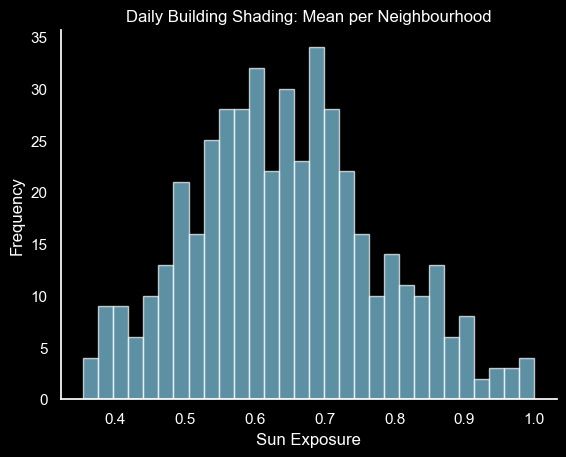

In [111]:
# Create a histogram with transparency and style it for a black background
plt.style.use('dark_background')

ax = buurten_with_stats.hist(
    column='day_building_mean', 
    bins=30, 
    edgecolor='white', 
    color='skyblue', 
    alpha=0.7, 
    grid=False
)

# Customize the plot further
for a in ax.flatten():
    a.set_xlabel('Sun Exposure')
    a.set_ylabel('Frequency')
    a.set_title('Daily Building Shading: Mean per Neighbourhood')
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    a.spines['left'].set_color('white')
    a.spines['bottom'].set_color('white')
    a.tick_params(axis='x', colors='white')
    a.tick_params(axis='y', colors='white')

# Show the plot
plt.show()

In [86]:
buurten_with_stats.explore(column='day_mean', cmap='RdYlBu_r', tiles= 'CartoDB positron')

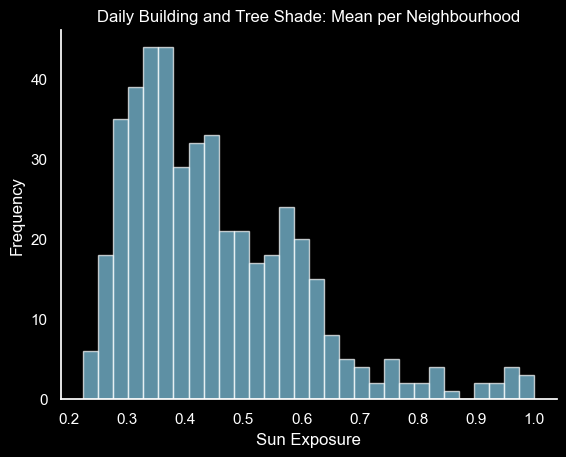

In [112]:
# Create a histogram with transparency and style it for a black background
plt.style.use('dark_background')

ax = buurten_with_stats.hist(
    column='day_mean', 
    bins=30, 
    edgecolor='white', 
    color='skyblue', 
    alpha=0.7, 
    grid=False
)

# Customize the plot further
for a in ax.flatten():
    a.set_xlabel('Sun Exposure')
    a.set_ylabel('Frequency')
    a.set_title('Daily Building and Tree Shade: Mean per Neighbourhood')
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    a.spines['left'].set_color('white')
    a.spines['bottom'].set_color('white')
    a.tick_params(axis='x', colors='white')
    a.tick_params(axis='y', colors='white')

# Show the plot
plt.show()

In [89]:
buurten_with_stats.explore(column='day_std', cmap='viridis', tiles= 'CartoDB positron')

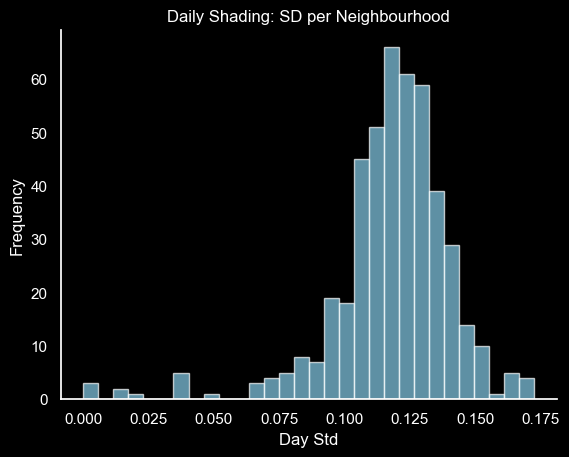

In [76]:
# Create a histogram with transparency and style it for a black background
plt.style.use('dark_background')

ax = buurten_with_stats.hist(
    column='day_std', 
    bins=30, 
    edgecolor='white', 
    color='skyblue', 
    alpha=0.7, 
    grid=False
)

# Customize the plot further
for a in ax.flatten():
    a.set_xlabel('Day Std')
    a.set_ylabel('Frequency')
    a.set_title('Daily Shading: SD per Neighbourhood')
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    a.spines['left'].set_color('white')
    a.spines['bottom'].set_color('white')
    a.tick_params(axis='x', colors='white')
    a.tick_params(axis='y', colors='white')

# Show the plot
plt.show()

In [90]:
buurten_with_stats.explore(column='lunch_mean_shade_perc', cmap='RdYlBu', tiles= 'CartoDB positron')



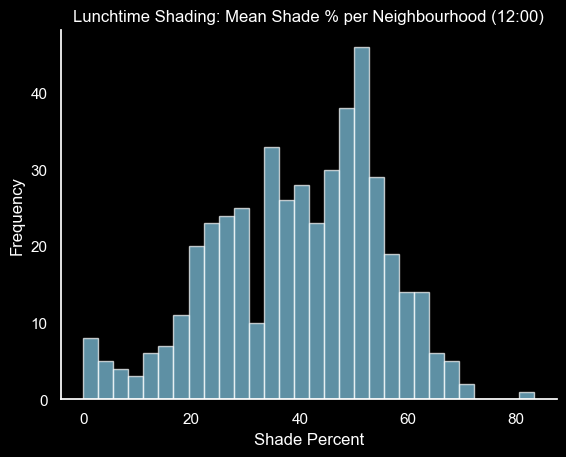

In [107]:
# Create a histogram with transparency and style it for a black background
plt.style.use('dark_background')

ax = buurten_with_stats.hist(
    column='lunch_mean_shade_perc', 
    bins=30, 
    edgecolor='white', 
    color='skyblue', 
    alpha=0.7, 
    grid=False
)

# Customize the plot further
for a in ax.flatten():
    a.set_xlabel('Shade Percent')
    a.set_ylabel('Frequency')
    a.set_title('Lunchtime Shading: Mean Shade % per Neighbourhood (12:00)')
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    a.spines['left'].set_color('white')
    a.spines['bottom'].set_color('white')
    a.tick_params(axis='x', colors='white')
    a.tick_params(axis='y', colors='white')

# Show the plot
plt.show()

In [81]:
buurten_with_stats.explore(column='closing_mean_shade_perc', cmap='GnBu_r', tiles= 'CartoDB positron')

In [103]:
buurten_with_stats['mean_diff'] = buurten_with_stats['mean_diff'].abs()


In [104]:
buurten_with_stats.explore(column='mean_diff', cmap='RdYlBu_r', tiles= 'CartoDB positron')

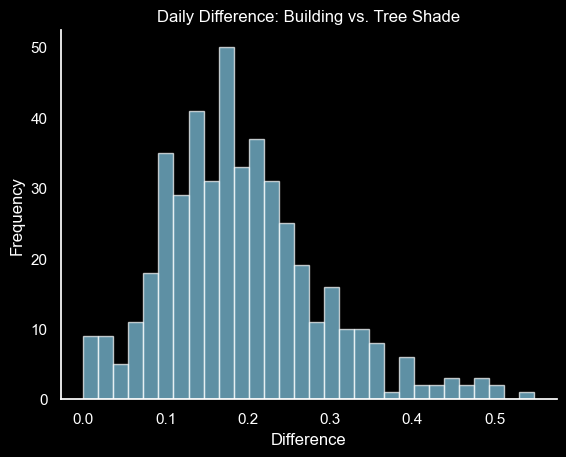

In [113]:
# Create a histogram with transparency and style it for a black background
plt.style.use('dark_background')

ax = buurten_with_stats.hist(
    column='mean_diff', 
    bins=30, 
    edgecolor='white', 
    color='skyblue', 
    alpha=0.7, 
    grid=False
)

# Customize the plot further
for a in ax.flatten():
    a.set_xlabel('Difference')
    a.set_ylabel('Frequency')
    a.set_title('Daily Difference: Building vs. Tree Shade')
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    a.spines['left'].set_color('white')
    a.spines['bottom'].set_color('white')
    a.tick_params(axis='x', colors='white')
    a.tick_params(axis='y', colors='white')

# Show the plot
plt.show()

In [ ]:
# Group by 'Buurtcode' and 'Gebruiksfunctie' and compute the mean
grouped_df = filtered_gdf.groupby(['Buurtcode', 'Gebruiksfunctie'])['diff_20240620_building_mean_vs_20240620_tree_mean'].mean().reset_index()
grouped_df.rename(columns={'diff_20240620_building_mean_vs_20240620_tree_mean': 'mean_diff'}, inplace=True)

In [ ]:
# Pivot the DataFrame to get 'Gebruiksfunctie' values as columns
pivoted_df = grouped_df.pivot_table(index='Buurtcode', columns='Gebruiksfunctie', values='mean_diff').reset_index()

# Optional: Rename columns for better readability, if needed
pivoted_df.columns.name = None  # Remove the name of the columns index

In [ ]:
pivoted_df.head()

In [47]:
# Assuming `additional_gdf` is your GeoDataFrame with the 'Buurtcode' column
# Load your GeoDataFrame with 'Buurtcode'
# additional_gdf = gpd.read_file('path_to_additional_geodatafile')

# Merge the grouped results with the GeoDataFrame on 'Buurtcode'
buurten_with_stats_new = buurten.merge(pivoted_df, on='Buurtcode', how='left')

# Display the resulting GeoDataFrame
buurten_with_stats_new.head()

,CBS_Buurtcode,Buurtcode,Buurt,Wijkcode,Wijk,Gebiedcode,Gebied,Stadsdeelcode,Stadsdeel,Oppervlakte_m2,geometry,Fietspad,Voetgangersgebied,Voetpad,Voetpad op trap
0,BU0363AC02,AC02,Leliegracht e.o.,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,172784,"POLYGON ((4.88307 52.37399, 4.88338 52.37407, ...",-0.185861,NaN,-0.164301,NaN
1,BU0363AC03,AC03,Felix Meritisbuurt,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,202396,"POLYGON ((4.88261 52.36893, 4.88441 52.36886, ...",NaN,NaN,-0.178693,NaN
2,BU0363AC04,AC04,Leidsegracht-Noord,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,68876,"POLYGON ((4.88260 52.36876, 4.88242 52.36674, ...",NaN,NaN,-0.206387,-0.425000
3,BU0363AD01,AD01,Stationsplein e.o.,AD,Burgwallen-Nieuwe Zijde,GA01,Centrum-West,A,Centrum,259429,"POLYGON ((4.89547 52.37986, 4.89753 52.37876, ...",-0.119065,-0.132768,-0.138979,-0.370652
4,BU0363AD02,AD02,Hemelrijk,AD,Burgwallen-Nieuwe Zijde,GA01,Centrum-West,A,Centrum,62725,"POLYGON ((4.89208 52.37703, 4.89420 52.37661, ...",-0.141378,NaN,-0.107807,-0.023625


In [57]:
buurten_with_stats_new.explore(column='Voetpad', cmap='RdYlGn_r', tiles= 'CartoDB positron')

In [115]:
buurten_with_stats

,CBS_Buurtcode,Buurtcode,Buurt,Wijkcode,Wijk,Gebiedcode,Gebied,Stadsdeelcode,Stadsdeel,Oppervlakte_m2,...,mean_diff,sum_diff,count_diff,median_diff,day_building_mean,day_building_std,day_mean,day_std,lunch_mean_shade_perc,closing_mean_shade_perc
0,BU0363AC02,AC02,Leliegracht e.o.,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,172784,...,0.164753,-23.559741,143.0,-0.140294,0.466583,0.086477,0.301829,0.112682,55.109013,54.182009
1,BU0363AC03,AC03,Felix Meritisbuurt,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,202396,...,0.178693,-30.377874,170.0,-0.167856,0.433613,0.083081,0.254919,0.109673,64.221784,65.292554
2,BU0363AC04,AC04,Leidsegracht-Noord,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,68876,...,0.209341,-15.491233,74.0,-0.191808,0.483385,0.074474,0.274044,0.096689,62.489631,55.896278
3,BU0363AD01,AD01,Stationsplein e.o.,AD,Burgwallen-Nieuwe Zijde,GA01,Centrum-West,A,Centrum,259429,...,0.135581,-10.168552,75.0,-0.069521,0.750307,0.084655,0.614726,0.114841,21.961009,27.662388
4,BU0363AD02,AD02,Hemelrijk,AD,Burgwallen-Nieuwe Zijde,GA01,Centrum-West,A,Centrum,62725,...,0.102361,-9.212528,90.0,-0.063499,0.472436,0.114619,0.370074,0.129009,44.764995,42.908681
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513,BU0363AB08,AB08,Groenmarktkadebuurt,AB,Jordaan,GA01,Centrum-West,A,Centrum,49285,...,0.245385,-13.250781,54.0,-0.214158,0.571347,0.119203,0.325962,0.123150,52.253374,58.051896
514,BU0363AB09,AB09,Marnixbuurt-Zuid,AB,Jordaan,GA01,Centrum-West,A,Centrum,51032,...,0.214942,-11.391909,53.0,-0.222685,0.496552,0.109867,0.281610,0.115440,54.933338,63.379491
515,BU0363AB10,AB10,Elandsgrachtbuurt,AB,Jordaan,GA01,Centrum-West,A,Centrum,207114,...,0.126857,-30.699498,242.0,-0.083482,0.405180,0.115428,0.278323,0.121409,61.548088,56.914978
516,BU0363AB11,AB11,Passeerdersgrachtbuurt,AB,Jordaan,GA01,Centrum-West,A,Centrum,54476,...,0.125866,-9.062318,72.0,-0.090984,0.434545,0.091379,0.308680,0.113958,55.274405,51.230073


In [119]:
sample = buurten_with_stats.sample(2)
sample_2 = buurten_with_stats[0:4]
sample

,CBS_Buurtcode,Buurtcode,Buurt,Wijkcode,Wijk,Gebiedcode,Gebied,Stadsdeelcode,Stadsdeel,Oppervlakte_m2,...,mean_diff,sum_diff,count_diff,median_diff,day_building_mean,day_building_std,day_mean,day_std,lunch_mean_shade_perc,closing_mean_shade_perc
286,BU0363SD03,SD03,Weesp Centrum,SD,Weesp Binnenstad/Zuid,GS25,"Weesp, Driemond",S,Weesp,420950,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
129,BU0363MN07,MN07,Sportpark Middenmeer-Noord,MN,Middenmeer,GM16,Watergraafsmeer,M,Oost,250051,...,0.354647,-36.528688,103.0,-0.357273,0.80913,0.083629,0.454482,0.126215,42.269555,40.930829


In [120]:
sample_2

,CBS_Buurtcode,Buurtcode,Buurt,Wijkcode,Wijk,Gebiedcode,Gebied,Stadsdeelcode,Stadsdeel,Oppervlakte_m2,...,mean_diff,sum_diff,count_diff,median_diff,day_building_mean,day_building_std,day_mean,day_std,lunch_mean_shade_perc,closing_mean_shade_perc
0,BU0363AC02,AC02,Leliegracht e.o.,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,172784,...,0.164753,-23.559741,143.0,-0.140294,0.466583,0.086477,0.301829,0.112682,55.109013,54.182009
1,BU0363AC03,AC03,Felix Meritisbuurt,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,202396,...,0.178693,-30.377874,170.0,-0.167856,0.433613,0.083081,0.254919,0.109673,64.221784,65.292554
2,BU0363AC04,AC04,Leidsegracht-Noord,AC,Grachtengordel-West,GA01,Centrum-West,A,Centrum,68876,...,0.209341,-15.491233,74.0,-0.191808,0.483385,0.074474,0.274044,0.096689,62.489631,55.896278
3,BU0363AD01,AD01,Stationsplein e.o.,AD,Burgwallen-Nieuwe Zijde,GA01,Centrum-West,A,Centrum,259429,...,0.135581,-10.168552,75.0,-0.069521,0.750307,0.084655,0.614726,0.114841,21.961009,27.662388


In [114]:
import pandas as pd

# Group by 'Gebruiksfunktie' and calculate mean for before and after
grouped_before = filtered_gdf.groupby('Gebruiksfunctie')[before_cols].mean()
grouped_after = filtered_gdf.groupby('Gebruiksfunctie')[after_cols].mean()

grouped_mean = filtered_gdf.groupby('Gebruiksfunctie')[before_cols + after_cols].mean()

# Calculate pairwise differences
for before_col, after_col in zip(before_cols, after_cols):
    diff_col_name = f'diff_{before_col}_vs_{after_col}'
    grouped_mean[diff_col_name] = grouped_mean[after_col] - grouped_mean[before_col]


grouped_mean
# # Calculate differences
# differences = grouped_after - grouped_before

# differences

,20240620_building_mean,20240620_building_std,20240620_building_min,20240620_building_max,building_shade_percent_at_1200,building_shade_percent_at_1500,building_shade_percent_at_1600,20240620_tree_mean,20240620_tree_std,20240620_tree_min,...,tree_shade_percent_at_1200,tree_shade_percent_at_1500,tree_shade_percent_at_1600,diff_20240620_building_mean_vs_20240620_tree_mean,diff_20240620_building_std_vs_20240620_tree_std,diff_20240620_building_min_vs_20240620_tree_min,diff_20240620_building_max_vs_20240620_tree_max,diff_building_shade_percent_at_1200_vs_tree_shade_percent_at_1200,diff_building_shade_percent_at_1500_vs_tree_shade_percent_at_1500,diff_building_shade_percent_at_1600_vs_tree_shade_percent_at_1600
Gebruiksfunctie,,,,,,,,,,,,,,,,,,,,,
Fietspad,0.733192,0.062769,0.531766,0.838483,7.542638,7.620454,9.133740,0.522400,0.104490,0.27888,...,30.404405,30.789139,33.653362,-0.210791,0.041721,-0.252885,-0.120393,22.861767,23.168685,24.519622
Voetpad,0.620261,0.095810,0.366186,0.834586,17.236681,16.226347,18.974032,0.427246,0.123658,0.17516,...,41.433009,40.866869,44.424105,-0.193014,0.027848,-0.191027,-0.122233,24.196328,24.640522,25.450074


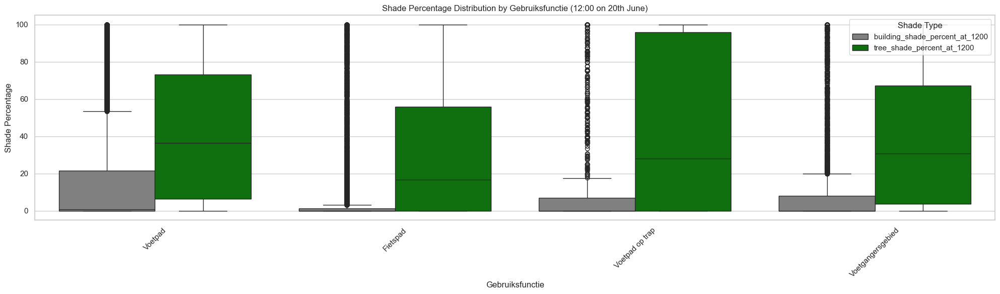

In [20]:

# Assuming gdf is your dataframe
# Melt the dataframe
melted_hourly = filtered_gdf.melt(id_vars=['Gebruiksfunctie','Buurtcode'], 
                      value_vars=['building_shade_percent_at_1200', 'tree_shade_percent_at_1200'], 
                      var_name='Shade_Type', 
                      value_name='Shade_Percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = {'building_shade_percent_at_1200': 'grey', 'tree_shade_percent_at_1200': 'green'}

# Box plot
plt.figure(figsize=(20, 6))
sns.boxplot(x='Gebruiksfunctie', y='Shade_Percentage', hue='Shade_Type', data=melted_hourly, palette=custom_palette)
plt.title('Shade Percentage Distribution by Gebruiksfunctie (12:00 on 20th June)')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()

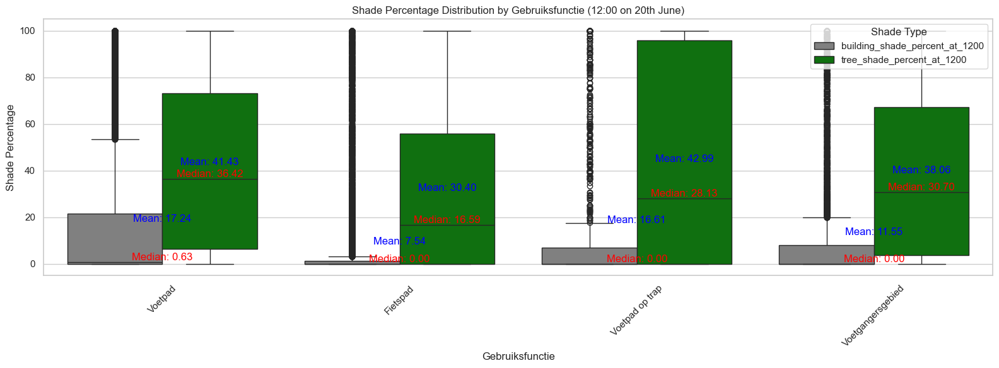

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming filtered_gdf is already defined and loaded

# Melt the dataframe
melted_hourly = filtered_gdf.melt(id_vars=['Gebruiksfunctie', 'Buurtcode'], 
                      value_vars=['building_shade_percent_at_1200', 'tree_shade_percent_at_1200'], 
                      var_name='Shade_Type', 
                      value_name='Shade_Percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = {'building_shade_percent_at_1200': 'grey', 'tree_shade_percent_at_1200': 'green'}

# Box plot
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x='Gebruiksfunctie', y='Shade_Percentage', hue='Shade_Type', data=melted_hourly, palette=custom_palette)

# Calculate mean and median for annotation
stats = melted_hourly.groupby(['Gebruiksfunctie', 'Shade_Type'])['Shade_Percentage'].agg(['mean', 'median']).reset_index()

# Add annotations for mean and median
for _, row in stats.iterrows():
    # Filter for each box plot element
    subset = melted_hourly[(melted_hourly['Gebruiksfunctie'] == row['Gebruiksfunctie']) & (melted_hourly['Shade_Type'] == row['Shade_Type'])]
    
    # Get the position of the boxplot for this group
    x_pos = melted_hourly['Gebruiksfunctie'].unique().tolist().index(row['Gebruiksfunctie'])
    hue_pos = melted_hourly['Shade_Type'].unique().tolist().index(row['Shade_Type'])
    
    # Label positions
    y_mean = row['mean']
    y_median = row['median']

    # Add text annotations
    ax.text(x_pos + hue_pos * 0.2, y_mean, f'Mean: {y_mean:.2f}', color='blue', ha='center', va='bottom')
    ax.text(x_pos + hue_pos * 0.2, y_median, f'Median: {y_median:.2f}', color='red', ha='center', va='bottom')

plt.title('Shade Percentage Distribution by Gebruiksfunctie (12:00 on 20th June)')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()

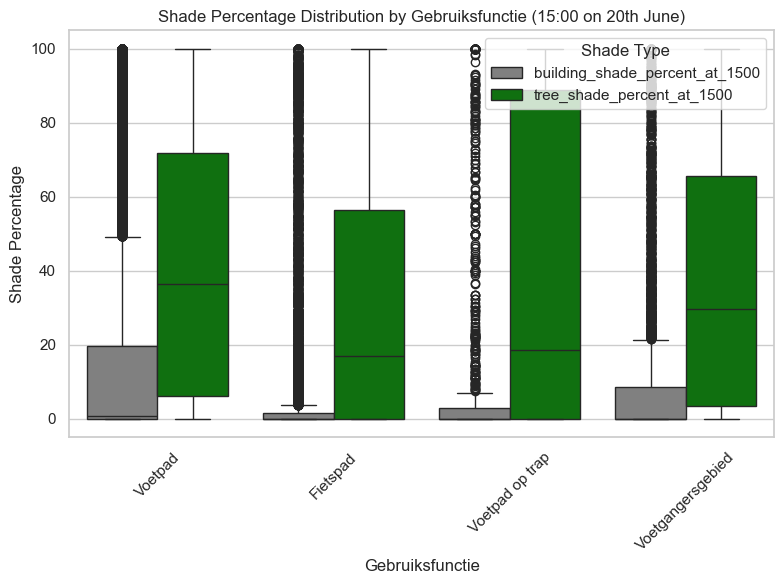

In [25]:

# Assuming gdf is your dataframe
# Melt the dataframe
melted_hourly = filtered_gdf.melt(id_vars=['Gebruiksfunctie','Buurtcode'], 
                      value_vars=['building_shade_percent_at_1500', 'tree_shade_percent_at_1500'], 
                      var_name='Shade_Type', 
                      value_name='Shade_Percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = {'building_shade_percent_at_1500': 'grey', 'tree_shade_percent_at_1500': 'green'}

# Box plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Gebruiksfunctie', y='Shade_Percentage', hue='Shade_Type', data=melted_hourly, palette=custom_palette)
plt.title('Shade Percentage Distribution by Gebruiksfunctie (15:00 on 20th June)')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()

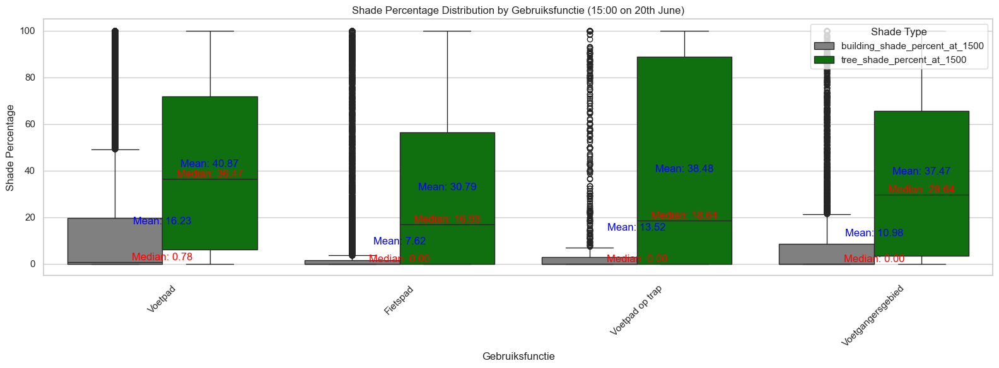

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming filtered_gdf is already defined and loaded

# Melt the dataframe
melted_hourly = filtered_gdf.melt(id_vars=['Gebruiksfunctie', 'Buurtcode'], 
                      value_vars=['building_shade_percent_at_1500', 'tree_shade_percent_at_1500'], 
                      var_name='Shade_Type', 
                      value_name='Shade_Percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = {'building_shade_percent_at_1500': 'grey', 'tree_shade_percent_at_1500': 'green'}

# Box plot
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x='Gebruiksfunctie', y='Shade_Percentage', hue='Shade_Type', data=melted_hourly, palette=custom_palette)

# Calculate mean and median for annotation
stats = melted_hourly.groupby(['Gebruiksfunctie', 'Shade_Type'])['Shade_Percentage'].agg(['mean', 'median']).reset_index()

# Add annotations for mean and median
for _, row in stats.iterrows():
    # Filter for each box plot element
    subset = melted_hourly[(melted_hourly['Gebruiksfunctie'] == row['Gebruiksfunctie']) & (melted_hourly['Shade_Type'] == row['Shade_Type'])]
    
    # Get the position of the boxplot for this group
    x_pos = melted_hourly['Gebruiksfunctie'].unique().tolist().index(row['Gebruiksfunctie'])
    hue_pos = melted_hourly['Shade_Type'].unique().tolist().index(row['Shade_Type'])
    
    # Label positions
    y_mean = row['mean']
    y_median = row['median']

    # Add text annotations
    ax.text(x_pos + hue_pos * 0.2, y_mean, f'Mean: {y_mean:.2f}', color='blue', ha='center', va='bottom')
    ax.text(x_pos + hue_pos * 0.2, y_median, f'Median: {y_median:.2f}', color='red', ha='center', va='bottom')

plt.title('Shade Percentage Distribution by Gebruiksfunctie (15:00 on 20th June)')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()

In [87]:
melted_hourly

,Gebruiksfunctie,Buurtcode,Shade_Type,Shade_Percentage
0,Halte eiland,KP05,building_shade_percent_at_1200,0.0
1,Halte eiland,KR01,building_shade_percent_at_1200,0.0
2,Halte eiland,KP05,building_shade_percent_at_1200,0.0
3,Voetpad,EL01,building_shade_percent_at_1200,0.0
4,Voetpad,EE05,building_shade_percent_at_1200,0.0
...,...,...,...,...
222639,Rijbaan,MH02,tree_shade_percent_at_1200,0.0
222640,Rijbaan,MH01,tree_shade_percent_at_1200,0.0
222641,Rijbaan,MH01,tree_shade_percent_at_1200,0.0
222642,Rijbaan,MH02,tree_shade_percent_at_1200,0.0


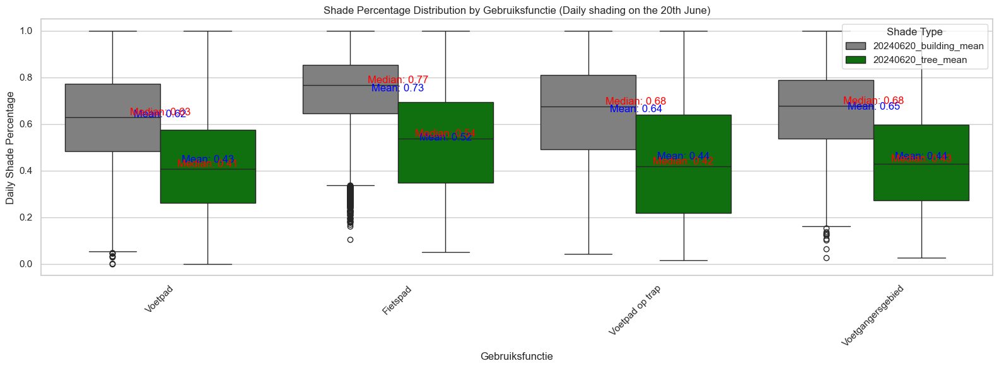

In [41]:
# Assuming gdf is your dataframe
# Melt the dataframe
melted_daily = filtered_gdf.melt(id_vars=['Gebruiksfunctie'], 
                      value_vars=['20240620_building_mean', '20240620_tree_mean'], 
                      var_name='Shade_Type', 
                      value_name='Daily_Shade_Percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = {'20240620_building_mean': 'grey', '20240620_tree_mean': 'green'}

# Box plot
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x='Gebruiksfunctie', y='Daily_Shade_Percentage', hue='Shade_Type', data=melted_daily, palette=custom_palette)

# Calculate mean and median for annotation
stats = melted_daily.groupby(['Gebruiksfunctie', 'Shade_Type'])['Daily_Shade_Percentage'].agg(['mean', 'median']).reset_index()

# Add annotations for mean and median
for _, row in stats.iterrows():
    # Filter for each box plot element
    subset = melted_daily[(melted_daily['Gebruiksfunctie'] == row['Gebruiksfunctie']) & (melted_daily['Shade_Type'] == row['Shade_Type'])]
    
    # Get the position of the boxplot for this group
    x_pos = melted_daily['Gebruiksfunctie'].unique().tolist().index(row['Gebruiksfunctie'])
    hue_pos = melted_daily['Shade_Type'].unique().tolist().index(row['Shade_Type'])
    
    # Label positions
    y_mean = row['mean']
    y_median = row['median']

    # Add text annotations
    ax.text(x_pos + hue_pos * 0.2, y_mean, f'Mean: {y_mean:.2f}', color='blue', ha='center', va='bottom')
    ax.text(x_pos + hue_pos * 0.2, y_median, f'Median: {y_median:.2f}', color='red', ha='center', va='bottom')

# Box plot
# plt.figure(figsize=(20, 6))
# sns.boxplot(x='Gebruiksfunctie', y='Daily_Shade_Percentage', hue='Shade_Type', data=melted_daily, palette=custom_palette)
plt.title('Shade Percentage Distribution by Gebruiksfunctie (Daily shading on the 20th June)')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Daily Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()

In [ ]:
# Assuming gdf is your dataframe
# Melt the dataframe
melted_daily = filtered_gdf.melt(id_vars=['Gebruiksfunctie'], 
                      value_vars=['20240620_building_mean', '20240620_tree_mean'], 
                      var_name='Shade_Type', 
                      value_name='Daily_Shade_Percentage')

# Set up the visualizations
sns.set(style="whitegrid")

# Define a custom color palette
custom_palette = {'20240620_building_mean': 'grey', '20240620_tree_mean': 'green'}

# Box plot
plt.figure(figsize=(20, 6))
sns.boxplot(x='Gebruiksfunctie', y='Daily_Shade_Percentage', hue='Shade_Type', data=melted_daily, palette=custom_palette)
plt.title('Shade Percentage Distribution by Gebruiksfunctie (Daily shading on the 20th June)')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Daily Shade Percentage')
plt.xticks(rotation=45)
plt.legend(title='Shade Type', loc='upper right')
plt.tight_layout()
plt.show()

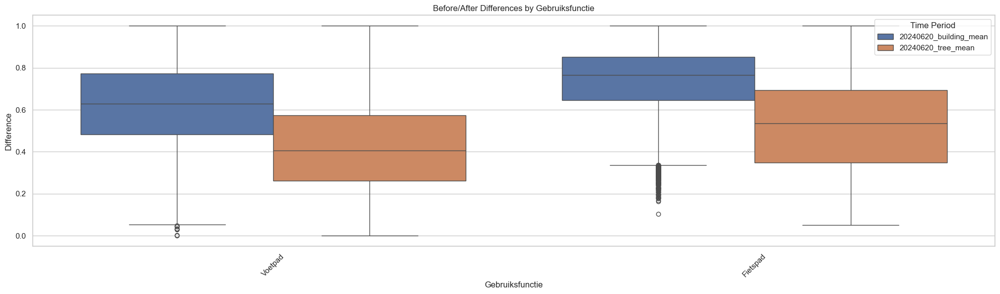

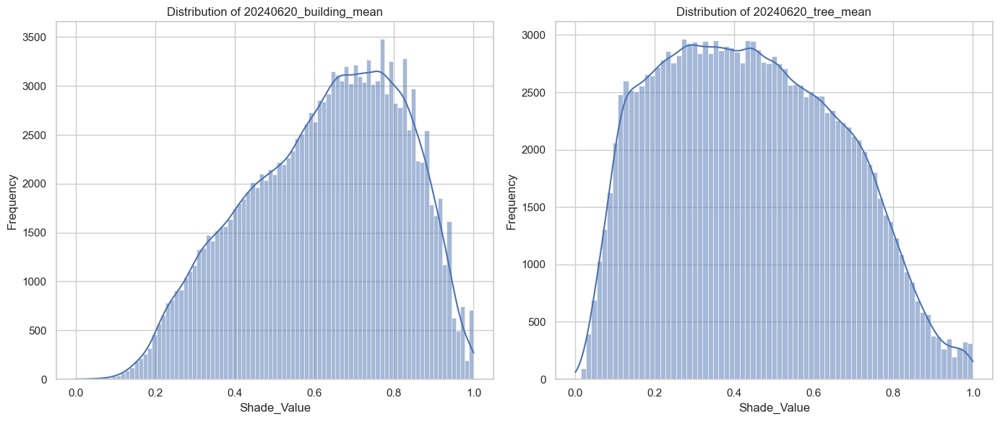

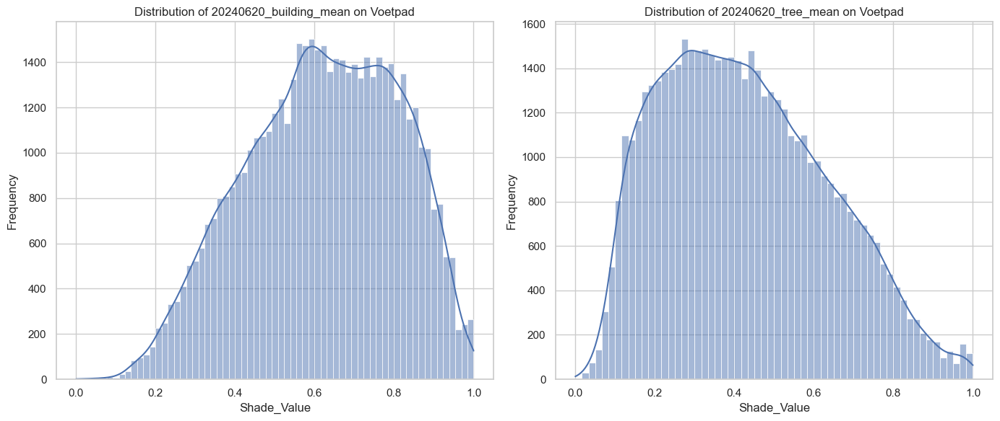

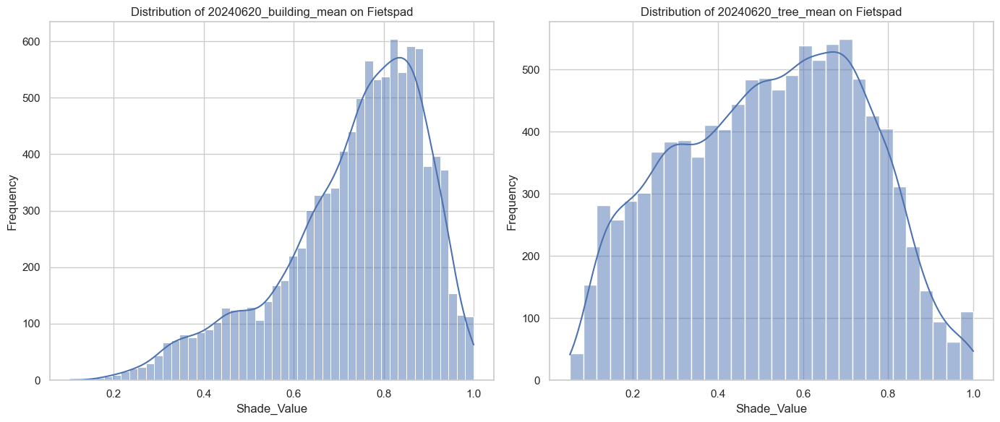

In [117]:
before_after_columns = ['20240620_building_mean', '20240620_tree_mean']

melted_gdf = filtered_gdf.melt(id_vars=['Gebruiksfunctie'], 
                      value_vars=before_after_columns, 
                      var_name='Time_Period', 
                      value_name='Shade_Value')

plt.figure(figsize=(20, 6))
sns.boxplot(x='Gebruiksfunctie', y='Shade_Value', hue='Time_Period', data=melted_gdf)
plt.title('Before/After Differences by Gebruiksfunctie')
plt.xlabel('Gebruiksfunctie')
plt.ylabel('Difference')
plt.xticks(rotation=45)
plt.legend(title='Time Period', loc='upper right')
plt.tight_layout()
plt.show()

# Histograms for before/after differences
plt.figure(figsize=(14, 6))
for i, column in enumerate(before_after_columns, 1):
    plt.subplot(1, 2, i)
    sns.histplot(gdf[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel('Shade_Value')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Define the subset of 'Gebruiksfunctie' to visualize
subset_value = ['Voetpad', 'Fietspad']

for subset in subset_value:
    gdf_subset = filtered_gdf[filtered_gdf['Gebruiksfunctie'] == subset]
    # Histograms for before/after differences
    plt.figure(figsize=(14, 6))
    for i, column in enumerate(before_after_columns, 1):
        plt.subplot(1, 2, i)
        sns.histplot(gdf_subset[column], kde=True)
        plt.title(f'Distribution of {column} on {subset}')
        plt.xlabel('Shade_Value')
        plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()



# # Scatter plot to explore relationships between columns
# plt.figure(figsize=(10, 6))
# sns.scatterplot(x=before_after_columns[0], y=before_after_columns[1], data=gdf_subset)
# plt.title('Scatter plot of Before vs After Differences')
# plt.xlabel('Before Difference')
# plt.ylabel('After Difference')
# plt.legend(title='Gebruiksfunctie')
# plt.tight_layout()
# plt.show()

# # Step 6: Spatial Analysis
# # Plotting the geospatial data
# plt.figure(figsize=(10, 10))
# gdf.plot(column=before_after_columns[0], legend=True, cmap='viridis')
# plt.title('Geospatial Plot of Before Differences')
# plt.show()

# plt.figure(figsize=(10, 10))
# gdf.plot(column=before_after_columns[0], legend=True, cmap='viridis')
# plt.title('Geospatial Plot of After Differences')
# plt.show()

In [118]:
melted_gdf.head()

,Gebruiksfunctie,Time_Period,Shade_Value
0,Voetpad,20240620_building_mean,0.911765
1,Voetpad,20240620_building_mean,0.911765
2,Voetpad,20240620_building_mean,0.757576
3,Voetpad,20240620_building_mean,0.460172
4,Voetpad,20240620_building_mean,0.933947


In [ ]:
for row, idx in dataframe.iterrows():
    trees_intersection = gpd.overlay(row, tree_dataset, how='intersection')
    

In [114]:
melted_gdf

NameError: name 'melted_gdf' is not defined